In [ ]:
# Import necessary libraries
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import ReduceLROnPlateau
import numpy as np
import albumentations as A
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import cv2
import os
from tensorflow.keras.callbacks import TensorBoard
import pandas as pd
from sklearn.model_selection import train_test_split

In [18]:
# import os
# import random
# import shutil

# def split_dataset(
#     source_dir,            # The folder with "Interior" & "Interior"
#     output_base_dir,       # Where to create train/, val/, test/ subfolders
#     train_ratio=0.7,       # 70%
#     val_ratio=0.2,         # 20%
#     test_ratio=0.1,        # 10%
#     seed=123
# ):  
#     """
#     Splits images from source_dir into train/ val/ and test/ folders in output_base_dir
#     with a 7:2:1 ratio by default.
#     """

#     # Reproducible shuffle
#     random.seed(seed)

#     # Classes are subfolders in source_dir (e.g., "Interior", "Interior")
#     classes = [cls for cls in os.listdir(source_dir) 
#                if os.path.isdir(os.path.join(source_dir, cls))]
#     print("Found classes:", classes)

#     # Create output subfolders: train/<cls>, val/<cls>, test/<cls>
#     for split in ['train', 'val', 'test']:
#         split_path = os.path.join(output_base_dir, split)
#         os.makedirs(split_path, exist_ok=True)
#         for cls in classes:
#             os.makedirs(os.path.join(split_path, cls), exist_ok=True)

#     for cls in classes:
#         cls_folder = os.path.join(source_dir, cls)
#         images = [
#             f for f in os.listdir(cls_folder) 
#             if os.path.isfile(os.path.join(cls_folder, f))
#         ]
#         # Shuffle image filenames
#         random.shuffle(images)

#         # Compute split indices
#         total_images = len(images)
#         train_count = int(train_ratio * total_images)
#         val_count   = int(val_ratio * total_images)
#         test_count  = total_images - train_count - val_count

#         # Slices
#         train_files = images[:train_count]
#         val_files   = images[train_count:train_count+val_count]
#         test_files  = images[train_count+val_count:]

#         # Copy images to respective folders
#         for f in train_files:
#             src_path = os.path.join(cls_folder, f)
#             dst_path = os.path.join(output_base_dir, 'train', cls, f)
#             shutil.copy2(src_path, dst_path)

#         for f in val_files:
#             src_path = os.path.join(cls_folder, f)
#             dst_path = os.path.join(output_base_dir, 'val', cls, f)
#             shutil.copy2(src_path, dst_path)

#         for f in test_files:
#             src_path = os.path.join(cls_folder, f)
#             dst_path = os.path.join(output_base_dir, 'test', cls, f)
#             shutil.copy2(src_path, dst_path)

#         print(f"Class '{cls}': {train_count} train, {val_count} val, {test_count} test")


# # Example usage
# if __name__ == "__main__":
#     source_data_dir = r"D:\Github\Sophiq\tasks\LandMark classifier\Training"
#     output_base_dir = r"D:\Github\Sophiq\tasks\LandMark classifier"  # Ensure absolute path
    
#     split_dataset(
#         source_dir=source_data_dir,
#         output_base_dir=output_base_dir,
#         train_ratio=0.7,
#         val_ratio=0.2,
#         test_ratio=0.1,
#         seed=123
#     )


In [19]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
INITIAL_EPOCHS = 30
# FINE_TUNE_EPOCHS = 30

In [20]:
train_transforms = A.Compose([
    A.RandomResizedCrop(224, 224, scale=(0.8, 1.0), ratio=(0.75, 1.33), p=0.5),
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=15, p=0.5),
    A.OneOf([
       
        A.CoarseDropout(max_holes=8, max_height=16, max_width=16, p=0.5),
    ], p=0.5),
    A.GridDropout(ratio=0.2, p=0.3),
    A.RandomBrightnessContrast(p=0.2),
    A.Normalize()
])

val_transforms = A.Compose([
    A.Resize(224, 224),
    A.Normalize()
])

In [21]:
def preprocess_image(img, transforms):
    """Apply augmentations to the image."""
    augmented = transforms(image=img)
    return augmented['image']

In [22]:
def load_and_preprocess_img(img_path, transforms):
    """Load and apply transformations to the image from a path."""
    print(img_path)
    img = cv2.imread(img_path)
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return preprocess_image(img, transforms)

In [23]:
class CustomDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, generator, transforms, batch_size=BATCH_SIZE):
        self.generator = generator
        self.transforms = transforms
        self.batch_size = batch_size

    def __len__(self):
        return len(self.generator)

    def __getitem__(self, index):
        batch_images, batch_labels = self.generator[index]
        batch_images = np.array([preprocess_image(image, self.transforms) for image in batch_images])
        return batch_images, batch_labels

In [24]:
train_dir = r"D:\Github\Sophiq\tasks\LandMark classifier\train"
val_dir = r"D:\Github\Sophiq\tasks\LandMark classifier\val"

In [25]:
raw_train_datagen = ImageDataGenerator()
raw_val_datagen = ImageDataGenerator()

train_generator = raw_train_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = raw_val_datagen.flow_from_directory(
    val_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

Found 6069 images belonging to 2 classes.
Found 1734 images belonging to 2 classes.


In [26]:
train_generator_aug = CustomDataGenerator(train_generator, train_transforms)
val_generator_aug = CustomDataGenerator(val_generator, val_transforms)

In [27]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  # Freeze the base model initially

In [28]:
##%% md
# Add custom classification head
##%%
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(train_generator.num_classes, activation='softmax')
])

In [29]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

In [30]:
lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1, min_lr=1e-6)


In [31]:
import datetime

os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

In [32]:
import tensorflow as tf

# 1. Check how many GPUs are visible to TensorFlow
gpus = tf.config.list_physical_devices('GPU')
print("Num GPUs Available:", len(gpus))
if gpus:
    print("GPUs detected:", gpus)
else:
    print("No GPU found. Training will run on CPU.")

# 2. Enable device placement logging
tf.debugging.set_log_device_placement(True)

# 3. Train your model (this is just an example snippet)
history = model.fit(
    train_generator_aug,
    epochs=INITIAL_EPOCHS,
    validation_data=val_generator_aug,
    callbacks=[lr_reduction, tensorboard_callback]
)

print("Training completed.")


Num GPUs Available: 0
No GPU found. Training will run on CPU.


C:\Users\TechAir\anaconda3\envs\myenv\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 266s 1s/step - accuracy: 0.7568 - loss: 0.4386 - val_accuracy: 0.9804 - val_loss: 0.0700 - learning_rate: 1.0000e-04
Epoch 2/30
121/190 ━━━━━━━━━━━━━━━━━━━━ 50s 728ms/step - accuracy: 0.8951 - loss: 0.1948

KeyboardInterrupt: 

In [35]:
model.save('landmark_classifier.h5')

In [33]:
import torch

def check_cuda():
    if torch.cuda.is_available():
        print("CUDA is available!")
        print(f"Number of GPUs: {torch.cuda.device_count()}")
        for i in range(torch.cuda.device_count()):
            print(f"GPU {i}: {torch.cuda.get_device_name(i)}")
    else:
        print("CUDA is not available.")

if __name__ == "__main__":
    check_cuda()

CUDA is available!
Number of GPUs: 1
GPU 0: NVIDIA GeForce GTX 1060 6GB


Found 856 images belonging to 2 classes.


c:\Users\TechAir\anaconda3\envs\myenv\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


27/27 ━━━━━━━━━━━━━━━━━━━━ 21s 734ms/step


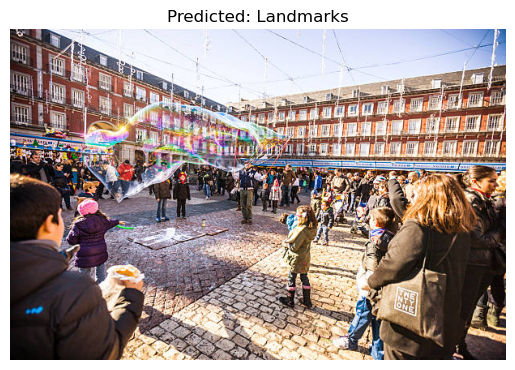

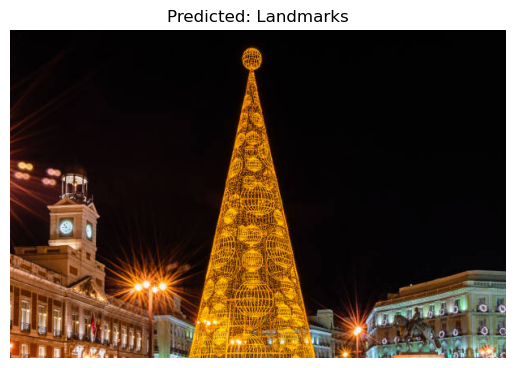

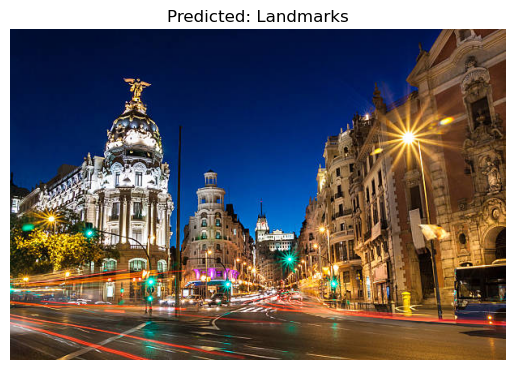

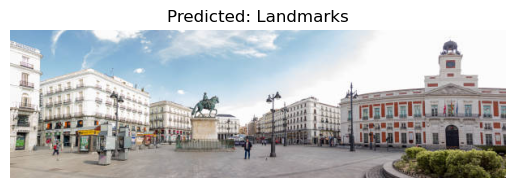

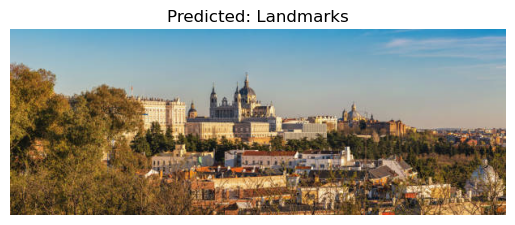

...

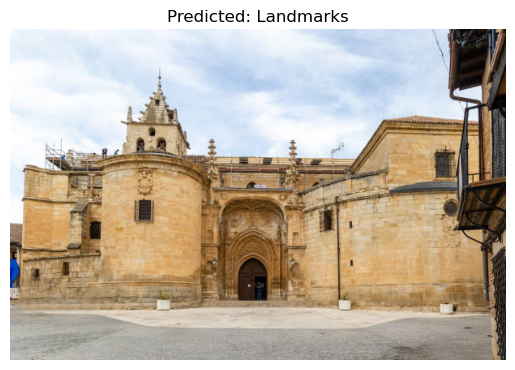

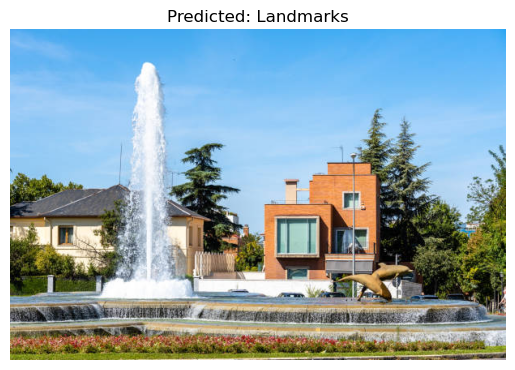

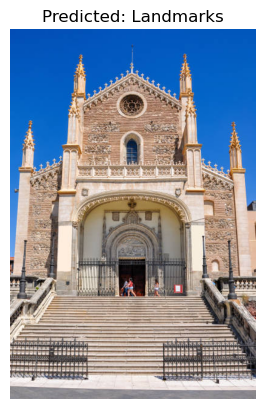

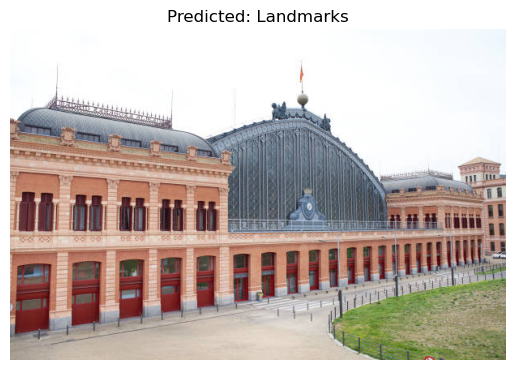

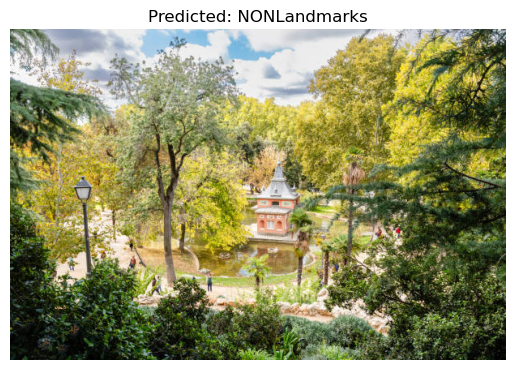

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load the trained model
model = tf.keras.models.load_model('landmark_classifier.h5')

# Set test directory
test_dir = r"D:\Github\Sophiq\tasks\LandMark classifier\LandMark classifier\test"

# Image properties
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# Create ImageDataGenerator for the test set (no augmentation, just rescaling)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load test images
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=None,  # No labels for test set
    shuffle=False  # Keep order for predictions
)

# Predict on the test set
predictions = model.predict(test_generator)

# Get predicted class labels
predicted_classes = np.argmax(predictions, axis=1)

# Map index to class names
class_indices = test_generator.class_indices
class_labels = {v: k for k, v in class_indices.items()}  # Reverse the dictionary

# Convert predicted indices to class labels
predicted_labels = [class_labels[idx] for idx in predicted_classes]

# ✅ Display the images with predictions
for i in range(30):  # Show first 10 images
    img_path = test_generator.filepaths[i]  # Get the image path

    # Load the image
    img = plt.imread(img_path)

    # Plot the image
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Predicted: {predicted_labels[i]}")
    plt.show()  # Show the image


In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import os

# Device configuration (use GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Parameters
batch_size = 16  # Adjust based on available memory
num_classes = len(os.listdir(r"D:\Github\Sophiq\tasks\LandMark classifier\train"))  # Automatically detect number of classes
num_epochs = 10  # Adjust for your needs
learning_rate = 0.001

# Data Transforms (Augmentation & Normalization)
train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # ResNet default input size
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Data Loaders
# data_dir = "data"  # Change to your dataset path
train_dir = r"D:\Github\Sophiq\tasks\LandMark classifier\train"
val_dir = r"D:\Github\Sophiq\tasks\LandMark classifier\val"

train_dataset = datasets.ImageFolder(train_dir, transform=train_transforms)
val_dataset = datasets.ImageFolder(val_dir, transform=val_transforms)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# Load Pretrained ResNet Model
model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)  # Best weights
model.fc = nn.Linear(model.fc.in_features, num_classes)  # Modify output layer for your dataset
model = model.to(device)

# Loss Function & Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Training Loop
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs):
    best_acc = 0.0
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        train_acc = correct / total
        val_acc = evaluate_model(model, val_loader)

        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

        # Save best model
        if val_acc > best_acc:
            best_acc = val_acc
            torch.save(model.state_dict(), "best_resnet_model.pth")

    print("Training complete. Best validation accuracy:", best_acc)


# Evaluation Function
def evaluate_model(model, val_loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return correct / total


# Train the model
train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs)

# Load Best Model (Optional)
best_model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
best_model.fc = nn.Linear(best_model.fc.in_features, num_classes)
best_model.load_state_dict(torch.load("best_resnet_model.pth"))
best_model = best_model.to(device)
best_model.eval()

print("Best model loaded and ready for inference.")


KeyboardInterrupt: 

In [12]:
from ultralytics import YOLO

# Load YOLOv8 model
model = YOLO("yolov8s-cls.pt")  # You can also use yolov8l-cls.pt for better accuracy

# ✅ Correct dataset.yaml path (inside `dataset/`)
dataset_yaml = r"D:/Github/Sophiq/tasks/LandMark classifier/dataset/data.yaml"

# Train the model on GPU
model.train(data=dataset_yaml, epochs=50, imgsz=224, device="cuda")

print("Training complete on GPU!")


New https://pypi.org/project/ultralytics/8.3.73 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.51  Python-3.10.8 torch-2.6.0+cu118 CUDA:0 (NVIDIA GeForce GTX 1060 6GB, 6144MiB)
engine\trainer: task=classify, mode=train, model=yolov8s-cls.pt, data=LandMark classifier/dataset/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=224, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train11, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, em

RuntimeError: Dataset 'LandMark classifier/dataset/data.yaml' error    Download failure for https://ultralytics.com/assets/LandMark classifier/dataset/data.yaml.zip. Retry limit reached.

In [1]:
from roboflow import Roboflow
rf = Roboflow(api_key="3xFKirsS741czk2JdZMF")
project = rf.workspace("techionik-sewuv").project("landmarks-clasification-efugd")
version = project.version(1)
dataset = version.download("openai")


loading Roboflow workspace...
loading Roboflow project...


RuntimeError: {'error': 'openai is an invalid format for project type classification. Please use one of: folder, clip.'}